# Brandan Keen
# MET 3601 Assignment #8

This assignment can be completed by adding code to this notebook for each question.

Turn in a completed script, renamed as

`assignment8_lastname.ipynb`

via JupyterHub and Canvas. 

**DUE DATE: 22 November 2024 at 11:59 p.m.**

Prior to turning in your script, please cleanup and comment your code for each problem. Be sure that your output is self-describing.

In [1]:
# Module imports 
from datetime import datetime, timedelta
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import metpy.calc as mpcalc
from metpy.interpolate import interpolate_to_grid
from metpy.io import add_station_lat_lon
from metpy.plots import StationPlot
from metpy.units import units
import numpy as np
from siphon.catalog import TDSCatalog
import xarray as xr

## Question #1
(25 points) Create a gridded interpolation of MSLP for a given date and time with a five minute timedelta. Plot a region for the eastern CONUS (from Colorado to just off the Atlantic coast) including the contours of MSLP (every 4 hPa) from the gridded interpolation and the MSLP values to the tenths (e.g., 1004.3 hPa).

Data (5 points):
  * Use ASOS surface observations using given definition to read data using a 5 minute timedelta
  * Use altimeter values (`alti`) and convert to units of `hPa` from `inHg`

Grid Interpolation (10 points):
  * interpolation type: `'rbf'`
  * horizontal grid spacing: `0.25` degree lat/lon
  * smooth contour field

Plot Grid and Observations (10 points):
  * Region: west=-110 W; east=-60 W; south=25 N; north=50 N
  * Use a Lambert Conformal Projection with `central_longitude=-100` and `central_latitude=40`
  * Contours of MSLP (every 4 hPa) from gridded interpolation of surface observations
  * Plot values of MSLP in tenths (e.g., 1003.4 hPa)
  * Reduce plotted values with radius of 100 km (https://unidata.github.io/MetPy/latest/api/generated/metpy.calc.reduce_point_density.html)
  
Example Image:
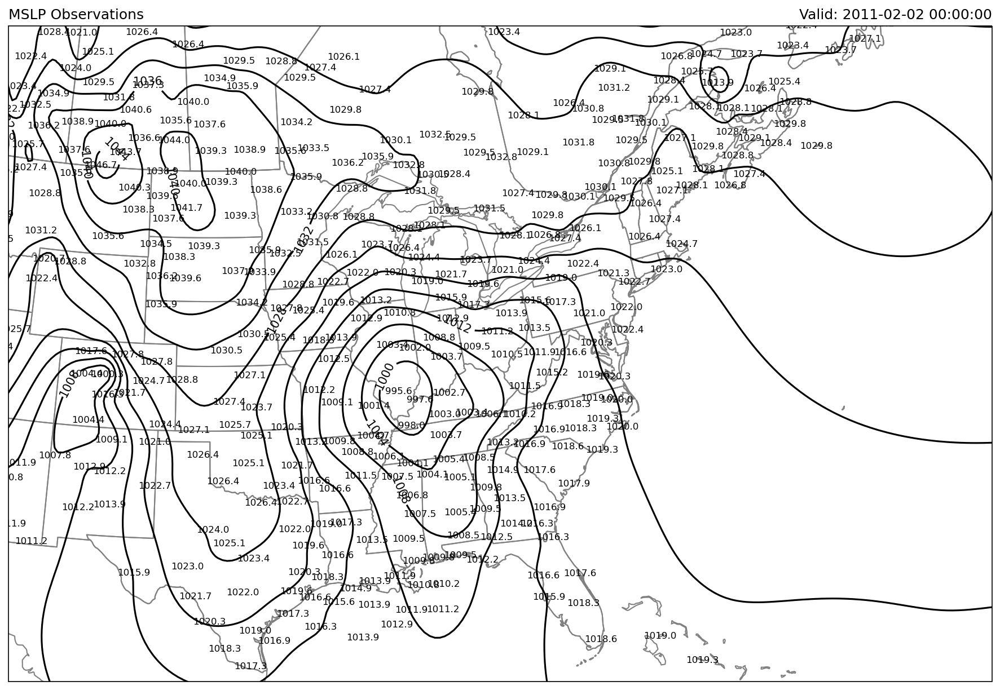

In [2]:
def read_remote_surface_data(date, dt=timedelta(minutes=5)):
    '''A function to read data from Iowa State ASOS archive.
    
    Input:
      - date: a datetime object
      - dt: a timedelta object indicating the timespan to collect data
    
    Output:
      - returns a Pandas DataFrame of the most recent surface observations from the given date, time, and timedelta range.
    '''
    import pandas as pd
    
    sdate = date - dt
    edate = date + dt

    df = pd.read_csv('http://mesonet.agron.iastate.edu/cgi-bin/request/asos.py?data=all&elev=yes&tz=Etc/UTC&format=comma&latlon=yes&'
                     f'year1={sdate.year}&month1={sdate.month}&day1={sdate.day}&hour1={sdate.hour}&minute1={sdate.minute}&'
                     f'year2={edate.year}&month2={edate.month}&day2={edate.day}&hour2={edate.hour}&minute2={edate.minute}',
                     skiprows=5, na_values=['M']).replace('T', 0.00001)
            
    return df.groupby('station').tail(1)


### I added "&elev=yes" to the link above to include elevation data in the df.

In [3]:
# Defining date
date = datetime(2024, 9, 27, 3)

# Reading in surface observation data
df = read_remote_surface_data(date, timedelta(minutes=5))


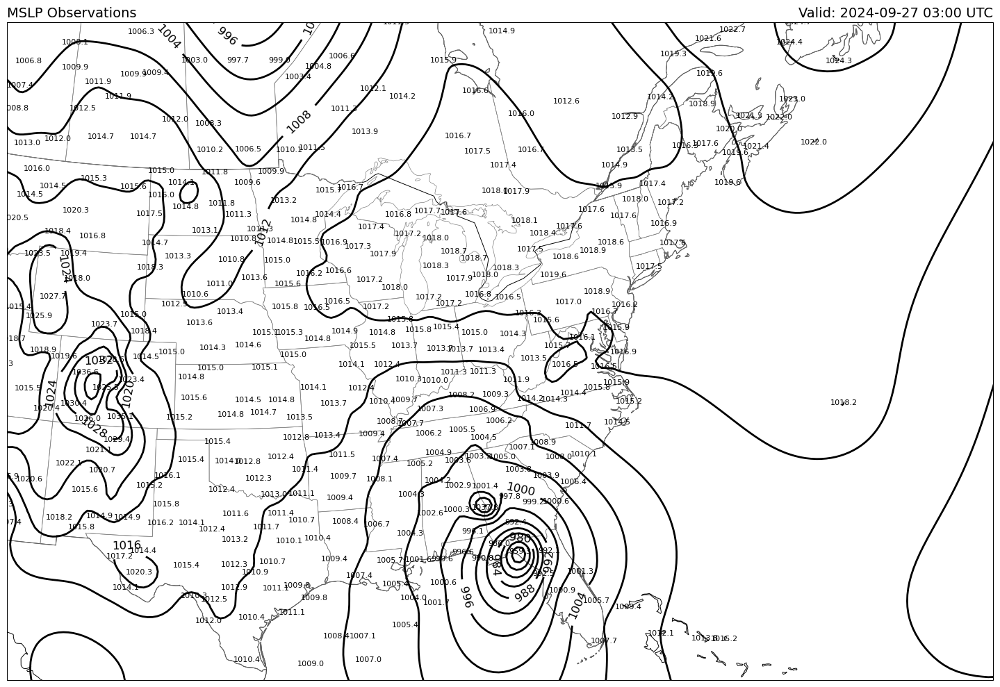

In [4]:
# Definiing lat/lon bounds to filter data
lon_min, lon_max, lat_min, lat_max = -130, 0, 15, 60

# Filtering the data to the specified region
df_subset = df[
    (df['lon'] >= lon_min) & (df['lon'] <= lon_max) &
    (df['lat'] >= lat_min) & (df['lat'] <= lat_max)]

# Removing rows with any missing values
df_subset = df_subset.dropna(subset=['lon', 'lat', 'alti', 'tmpf', 'elevation'])

# Defining variables and assigning MetPy units
altimeter = df_subset['alti'].values * units.inHg
altimeter_hPa = altimeter.to('hPa')
elevation = df_subset['elevation'].values * units.feet
temperature = df_subset['tmpf'].values * units.degF
lon = df_subset['lon'].values
lat = df_subset['lat'].values


# Converting altimeter to MSLP and adding to subset
mslp = mpcalc.altimeter_to_sea_level_pressure(altimeter_hPa, elevation, temperature)
df_subset['mslp'] = mslp.m


# Interpolating grid for MSLP
gridx, gridy, mslp_grid = interpolate_to_grid(
    df_subset.lon, df_subset.lat, df_subset.mslp,
    interp_type='rbf', search_radius=15, hres=.25)

# Smoothing grid
mslp_grid_smooth = mpcalc.smooth_n_point(mslp_grid, 9, 3)

# Plotting MSLP observations and contours
proj = ccrs.LambertConformal(central_longitude=-100, central_latitude=40 , standard_parallels=[40])
plt.figure(figsize=(15, 10))
ax = plt.subplot(111, projection=proj)
ax.set_extent([-110, -60, 25, 50], crs=ccrs.PlateCarree())

# MSLP contours
contour_levels = np.arange(900, 1100, 4)  # Contours every 4 hPa
contours = ax.contour(gridx, gridy, mslp_grid_smooth, levels=contour_levels, colors='black', linewidths=2.0, transform=ccrs.PlateCarree())
plt.clabel(contours, inline=True, fontsize=12, fmt='%d', colors='black')

# Reducing density of observations
point_locs = proj.transform_points(ccrs.PlateCarree(), df_subset['lon'].values, df_subset['lat'].values)
mask = mpcalc.reduce_point_density(point_locs, 100 * units.km)  # 100 km radius
df_subset_reduced = df_subset[mask]


# MSLP observations
station = StationPlot(ax, df_subset_reduced.lon, df_subset_reduced.lat, transform=ccrs.PlateCarree(), clip_on=True)
station.plot_parameter('C',df_subset_reduced.mslp, fontsize = 8, formatter='.1f')

# Adding map features
ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='black', linewidth=0.7)
ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor='black', linewidth=0.7)
ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor='gray', linewidth=0.5)

# Adding titles
plt.title('MSLP Observations', loc='left', fontsize=14)
plt.title(f'Valid: {date.strftime('%Y-%m-%d %H:%M UTC')}', loc='right', fontsize=14)

plt.tight_layout()
plt.show()


### The isobars look incorrect around the central Georgia/Alabama border from a goober MSLP value (1037.8 hPa). 
### I plotted a zoomed in image to identify the culprit value, then used a loop to remove it from the data frame.

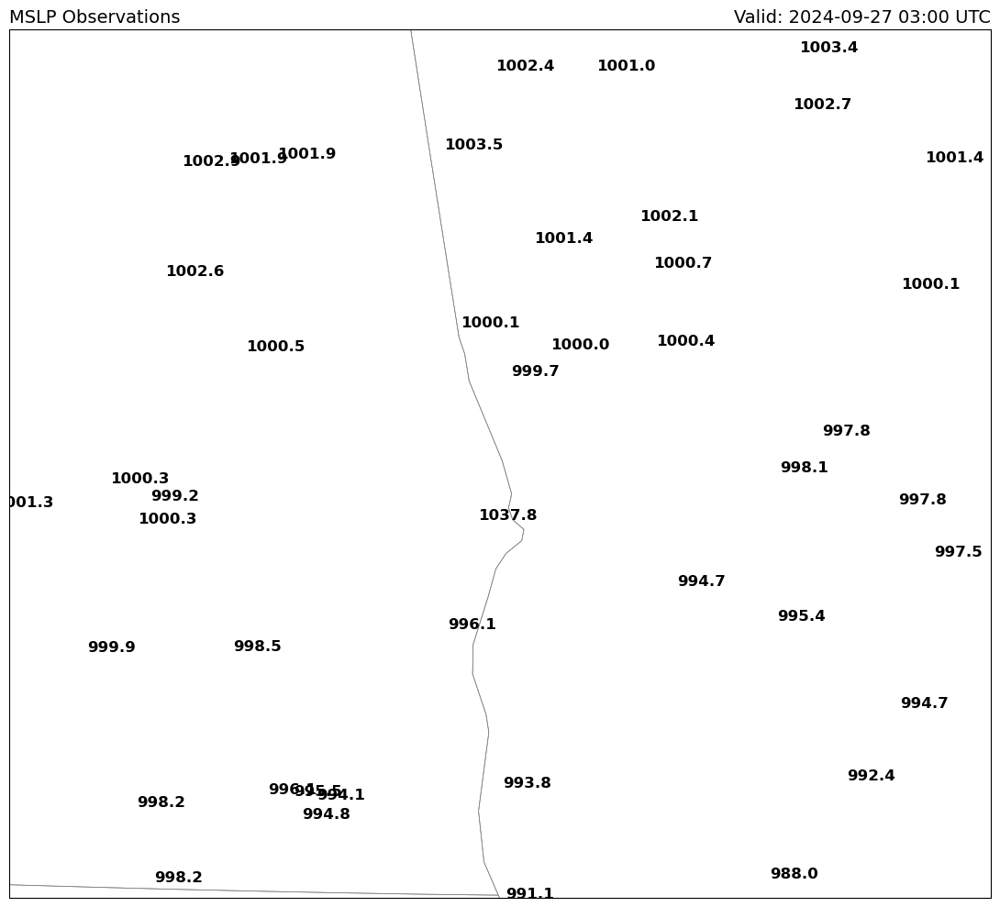

In [5]:

# Defining region with incorrect MSLP 
region_lon_min, region_lon_max = -87, -83
region_lat_min, region_lat_max = 31, 34

# Plotting region MSLP obs
proj = ccrs.LambertConformal(central_longitude=-83.5, central_latitude=30.1, standard_parallels=[30])
plt.figure(figsize=(15, 10))
ax = plt.subplot(111, projection=proj)
ax.set_extent([region_lon_min, region_lon_max, region_lat_min, region_lat_max], crs=ccrs.PlateCarree())

station = StationPlot(ax, df_subset['lon'].values, df_subset['lat'].values, transform=ccrs.PlateCarree(), clip_on=True)
station.plot_parameter('C', df_subset['mslp'],fontsize=12, fontweight='bold', formatter=lambda v: f"{v:.1f}")

# Adding map features
ax.add_feature(cfeature.COASTLINE.with_scale('10m'), edgecolor='black', linewidth=0.7)
ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor='black', linewidth=0.7)
ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor='gray', linewidth=0.5)

# Adding titles
plt.title('MSLP Observations', loc='left', fontsize=14)
plt.title(f'Valid: {date.strftime("%Y-%m-%d %H:%M UTC")}', loc='right', fontsize=14)

plt.tight_layout()
plt.show()


In [6]:
# Identifying and checking the stations values to determine the issue (turned out to be the altimeter)

#print(region)
#prob_station = region['station'] == 'LSF'
#print(region[prob_station].mslp)
#print(region[prob_station].alti)    
#print(region[prob_station].tmpf)
#print(region[prob_station].elevation)


In [7]:
# Defining problem station identifier
prob_station = 'LSF' 


# Removing the row containing the problem station
for row, station_data in df_subset.iterrows():
    if station_data['station'] == prob_station:
        df_subset.drop(row, inplace=True)


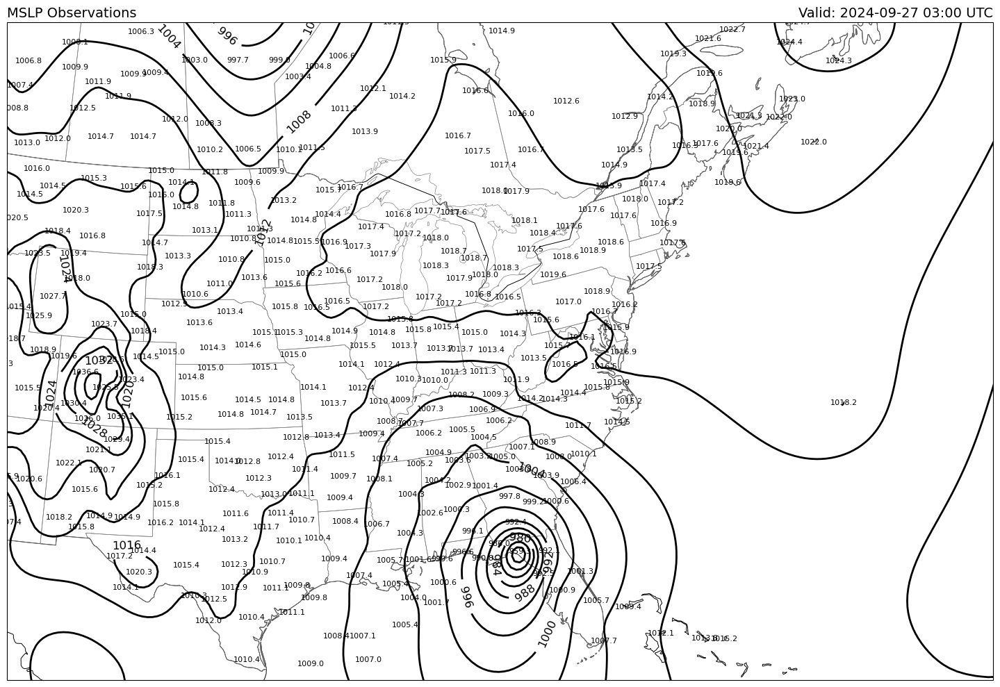

In [8]:
# Interpolating grid for MSLP
gridx, gridy, mslp_grid = interpolate_to_grid(
    df_subset.lon, df_subset.lat, df_subset.mslp,
    interp_type='rbf', search_radius=15, hres=.25)

# Smoothing grid
mslp_grid_smooth = mpcalc.smooth_n_point(mslp_grid, 9, 3)

# Plotting MSLP observations and contours
proj = ccrs.LambertConformal(central_longitude=-100, central_latitude=40 , standard_parallels=[40])
plt.figure(figsize=(15, 10))
ax = plt.subplot(111, projection=proj)
ax.set_extent([-110, -60, 25, 50], crs=ccrs.PlateCarree())

# MSLP contours
contour_levels = np.arange(900, 1100, 4)  # Contours every 4 hPa
contours = ax.contour(gridx, gridy, mslp_grid_smooth, levels=contour_levels,
                      colors='black', linewidths=2.0, transform=ccrs.PlateCarree())
plt.clabel(contours, inline=True, fontsize=12, fmt='%d', colors='black')

# Reducing density of observations
point_locs = proj.transform_points(ccrs.PlateCarree(), df_subset['lon'].values, df_subset['lat'].values)
mask = mpcalc.reduce_point_density(point_locs, 100 * units.km)  # 100 km radius
df_subset_reduced = df_subset[mask]


# MSLP observations
station = StationPlot(ax, df_subset_reduced.lon, df_subset_reduced.lat, transform=ccrs.PlateCarree(),clip_on=True)
station.plot_parameter('C',df_subset_reduced.mslp, fontsize = 8, formatter='.1f')

# Adding map features
ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='black', linewidth=0.7)
ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor='black', linewidth=0.7)
ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor='gray', linewidth=0.5)

# Adding titles
plt.title('MSLP Observations', loc='left', fontsize=14)
plt.title(f'Valid: {date.strftime('%Y-%m-%d %H:%M UTC')}', loc='right', fontsize=14)

plt.tight_layout()
plt.savefig(f'MSLP_Obs_{date.strftime('%Y_%m_%d_%H')}')
plt.show()


### I couldnt help but plot a zoomed in version of Helene!

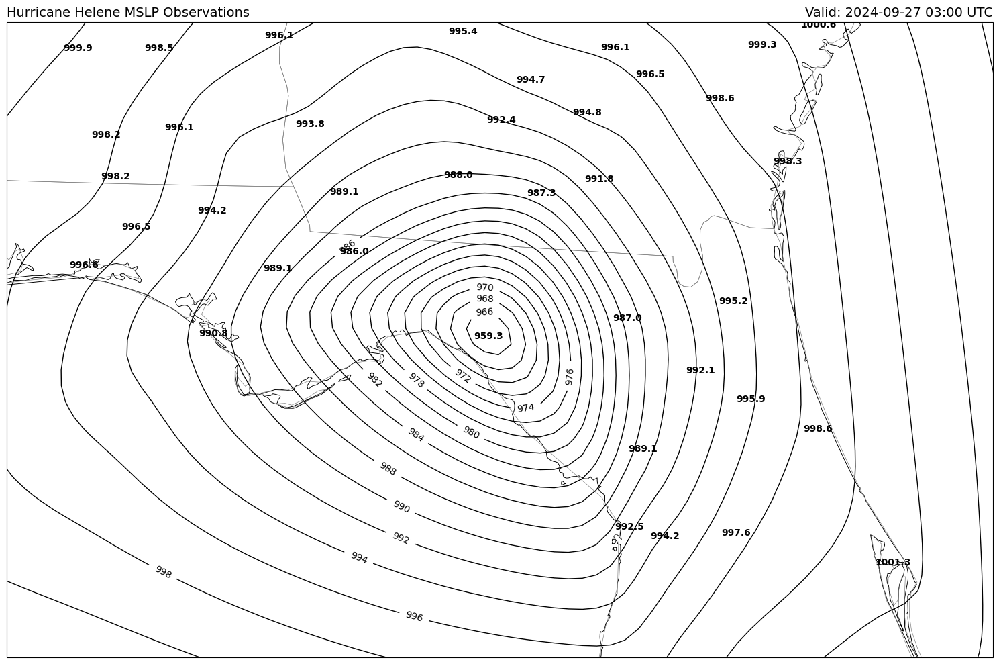

In [9]:
# Defining local region near Hurricane Helene's landfall location
local_lon_min, local_lon_max, local_lat_min, local_lat_max = -90, -70, 20, 35


# Filtering subset data for local region
df_subset_local = df_subset[
    (df_subset['lon'] >= local_lon_min) & (df_subset['lon'] <= local_lon_max) &
    (df_subset['lat'] >= local_lat_min) & (df_subset['lat'] <= local_lat_max)]

# Interpolating grid for MSLP using natural_neighbor and higher resolution
local_gridx, local_gridy, local_mslp_grid = interpolate_to_grid(
    df_subset_local['lon'].values, df_subset_local['lat'].values, df_subset_local['mslp'].values,
    interp_type='natural_neighbor', hres=0.1)

# Smoothing grid
local_mslp_grid_smooth = mpcalc.smooth_n_point(local_mslp_grid, 9, 3)

# Plotting MSLP observations and contours
plt.figure(figsize=(15, 10))
proj = ccrs.LambertConformal(central_longitude=-83.5, central_latitude=30.1, standard_parallels=[30])
ax = plt.subplot(111, projection=proj)
ax.set_extent([-87, -80, 28, 32], crs=ccrs.PlateCarree())

# MSLP contours
contour_levels = np.arange(900, 1100, 2)  # Contour levels every 2 hPa
contours = ax.contour(local_gridx, local_gridy, local_mslp_grid_smooth, levels=contour_levels,
                      colors='black',linewidths=1.0, transform=ccrs.PlateCarree())
plt.clabel(contours, inline=True, fontsize=10, fmt='%d', colors='black')

# Reducing density of observations
point_locs = proj.transform_points(ccrs.PlateCarree(), df_subset_local['lon'].values, df_subset_local['lat'].values)
mask = mpcalc.reduce_point_density(point_locs, 25 * units.km)  # 100 km radius
df_subset_local_reduced = df_subset_local[mask]

# MSLP values
station = StationPlot(ax, df_subset_local_reduced['lon'].values, df_subset_local_reduced['lat'].values,
                      transform=ccrs.PlateCarree(), clip_on=True)
station.plot_parameter('C', df_subset_local_reduced['mslp'],fontweight='bold',fontsize=10, formatter='.1f')

# Adding map features
ax.add_feature(cfeature.COASTLINE.with_scale('10m'), edgecolor='black', linewidth=0.7)
ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor='black', linewidth=0.7)
ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor='gray', linewidth=0.5)

# Adding titles
plt.title('Hurricane Helene MSLP Observations', loc='left', fontsize=14)
plt.title(f'Valid: {date.strftime("%Y-%m-%d %H:%M UTC")}', loc='right', fontsize=14)

plt.tight_layout()
plt.savefig(f'Hurricane_Helene_MSLP_Obs_{date.strftime('%Y_%m_%d_%H')}')
plt.show()



## Question #2

(35 points) Construct an RGB Airmass product for GOES-16 for a chosen date and time (where the time should be one of 00, 06, 12, or 18 UTC) and compute and plot the GFS 303 K isentropic surface (pressure and wind components) over a CONUS domain as an overlay on the computed RGB Airmass image.

The RGB Airmass product is a combination of four different infrared bands. It is useful for identifying air masses, monitoring jet streams and jet streaks, cyclogenesis and potential vorticity maxima or anomalies.
 - The 'Red' channel is a difference of ABI bands 8 and 10
 - The 'Green' is a difference of bands 12 and 13
 - The 'Blue' is solely being represented by ABI band 8 (convert to Celsius from Kelvin).

Convert Channel to values between 0 and 1 with:
`channel = ((channel - min_val) / (max_val - min_val))**(1 / gamma)`

## Airmass RGB Recipe
Color | Band / Band Diff. (μm) | Min – Max | Gamma
-|-|-|-
Red | 6.2 – 7.3 | -26.2 to 0.6 C | 1
Green | 9.6 – 10.3 | -43.2 to 6.7 C | 1
Blue | 6.2 | -29.25 to -64.65 C | 1

Question Elements:
* Read required ABI bands 8, 10, 12, and 13 (5 points)
  - Use the function given below to read each channel and isolate the `Sectorized_CMI` variable
* Compute RGB Airmass imagery (10 points)
* Compute the GFS 303 K isentropic surface (5 points)
  - Use the following data access for recent GFS, which uses a datetime object stored as `date`
```python
  ds = xr.open_dataset('https://thredds.ucar.edu/thredds/dodsC/grib/NCEP/GFS/'
                      f'Global_0p5deg/GFS_Global_0p5deg_{date:%Y%m%d_%H}00.grib2')
```
* Plot the RGB Airmass imagery (5 points)
* Plot the 300 K isentropic pressure and wind barbs as an overlay (10 points)

Example Image:
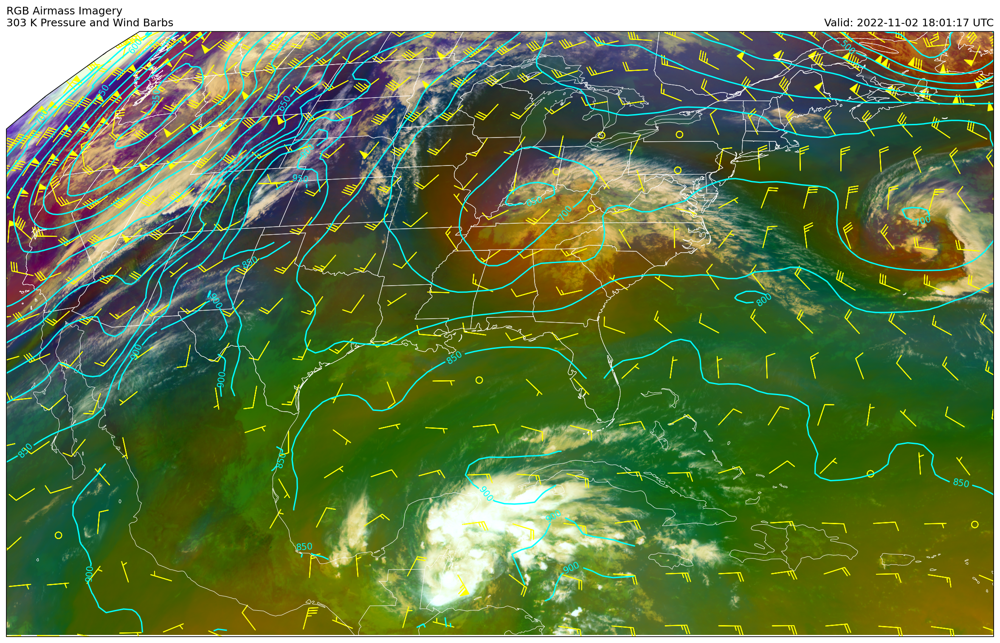

In [10]:
def get_satellite_data(date, region, satellite, channel):
    '''
    This function helps to obtain GOES satellite data by channel from the UCAR THREDDS server.
    
    Input:
      * date - a datetime object specifying the desired time
      * region - the portion of satellite data wanted
        - CONUS (default)
        - fulldisk
      * channel (int value 1 - 16; default is 2)
      * satellite ('east' or 'west'; default is 'east')
    
    Output:
      * xarray DataArray containing the nearest time requested satellite data for the region, channel, and satellite.
    '''
    # We want to match something like:
    # https://thredds-test.unidata.ucar.edu/thredds/catalog/satellite/goes16/GOES16/Mesoscale-1/Channel08/20181113/catalog.html

    # Construct the data_url string
    data_url = (f'https://thredds.ucar.edu/thredds/catalog/satellite/goes/{satellite}/products/'
                f'CloudAndMoistureImagery/{region}/Channel{channel:02d}/'
                f'{date:%Y%m%d}/catalog.xml')

    # Get list of files available for particular day
    cat = TDSCatalog(data_url)

    # Grab dataset for desired time
    dataset = cat.datasets.filter_time_nearest(date, regex=r'_s(?P<strptime>\d{13})', strptime='%Y%j%H%M%S')

    # Open most recent file available
    ds = dataset.remote_access(use_xarray=True).metpy.parse_cf()
    
    return ds

def normalize_channel(channel, min_val, max_val, gamma=1):
    """Normalize RGB channel values to be between 0 and 1.
    
    This function scales the values of a given RGB channel to a 0-1 range 
    using provided minimum and maximum bounds. It also applies a gamma 
    correction to adjust the intensity distribution of the channel.

    Input: 
        channel       - a NumPy array representing the R, G, or B channel.
        min_val       - the minimum value for normalization.
        max_val       - the maximum value for normalization.
        gamma         - gamma correction (default is 1).
                        
    Output:
        A normalized and gamma-adjusted array with values scaled between 0 and 1.

    Formula:
        Normalized channel = ((channel - min_val) / (max_val - min_val)) ** (1 / gamma)
    """
    return ((channel - min_val) / (max_val - min_val))**(1 / gamma)


In [11]:
# Setting date, region, satellite
date = datetime(2024, 11, 20, 6)
region = 'CONUS'
satellite = 'east'

# Pulling the Sectorized_CMI data from channels 8, 10, 12, and 13
ch8 =  get_satellite_data(date, region, satellite, channel=8) ['Sectorized_CMI']
ch10 = get_satellite_data(date, region, satellite, channel=10)['Sectorized_CMI']
ch12 = get_satellite_data(date, region, satellite, channel=12)['Sectorized_CMI']
ch13 = get_satellite_data(date, region, satellite, channel=13)['Sectorized_CMI']

#Checking dataset variables and dimensions
#print(red.shape,green.shape,blue.shape)
#print(ch8)
#print(ch8.x,ch8.y)

In [12]:
# Defining RGB channels
red   = ch8  - ch10
green = ch12 - ch13
blue  = ch8  - 273.15       # converting blue channel to celcius

# Normalizing RGB channels
gamma = 1
red   = normalize_channel (red, -26.2, 0.6,gamma)
green = normalize_channel (green, -43.2, 6.7,gamma)
blue  = normalize_channel (blue, -29.25, -64.65,gamma)

In [13]:
# Opening the GFS dataset for the specified date and time
gfs_url = ('https://thredds.ucar.edu/thredds/dodsC/grib/NCEP/GFS/'
           f'Global_0p5deg/GFS_Global_0p5deg_{date:%Y%m%d_%H}00.grib2')
ds = xr.open_dataset(gfs_url)

#Checking dataset coordinate system
#print(ds.lat,ds.lon)

In [14]:
# Subsetting GFS dataset to include only relevant variables and geographic region
varlist = ['Temperature_isobaric','u-component_of_wind_isobaric','v-component_of_wind_isobaric']

ds_subset = ds[varlist]

subset = dict(lat=slice(60, 10), lon=slice(360-140, 360-50),
              time=date, vertical=slice(100, None))

tmpk = ds_subset.Temperature_isobaric.metpy.sel(subset)
uwnd = ds_subset['u-component_of_wind_isobaric'].metpy.sel(subset)
vwnd = ds_subset['v-component_of_wind_isobaric'].metpy.sel(subset)

In [15]:
# Defining isentropic levels 
isent_levels = np.arange(285, 326, 3) * units.K  # Levels from 285 to 325 K

# Interpolating temperature and wind components to isentropic levels
isent = mpcalc.isentropic_interpolation_as_dataset(
    isent_levels, 
    tmpk,  # Temperature
    uwnd,  # U-component of wind
    vwnd,  # V-component of wind
)

# Specifying isentropic level to plot
level = 300 * units.K

# Extracting data for specified isentropic level
isent_pres = isent['pressure'].sel(isentropic_level=level)
isent_uwnd = isent['u-component_of_wind_isobaric'].sel(isentropic_level=level)
isent_vwnd = isent['v-component_of_wind_isobaric'].sel(isentropic_level=level)

# Smoothing pressure fields
isent_pres_smooth = mpcalc.smooth_n_point(isent_pres, 9, 3)

# Thinning wind components
isent_uwnd = isent_uwnd.isel(lat=slice(None, None, 5), lon=slice(None, None, 5))
isent_vwnd = isent_vwnd.isel(lat=slice(None, None, 5), lon=slice(None, None, 5))

/tmp/ipykernel_7571/1126318036.py:5: UserWarning: Interpolation point out of data bounds encountered
  isent = mpcalc.isentropic_interpolation_as_dataset(
/share/share/additional-envs/fit24f-dev/lib/python3.12/site-packages/metpy/interpolate/one_dimension.py:160: RuntimeWarning: divide by zero encountered in divide
  var_interp = var[below] + (var[above] - var[below]) * ((x_array - xp[below])


/share/share/additional-envs/fit24f-dev/lib/python3.12/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/share/share/additional-envs/fit24f-dev/lib/python3.12/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/share/share/additional-envs/fit24f-dev/lib/python3.12/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/share/share/additional-envs/fit24f-dev/lib/python3.12/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


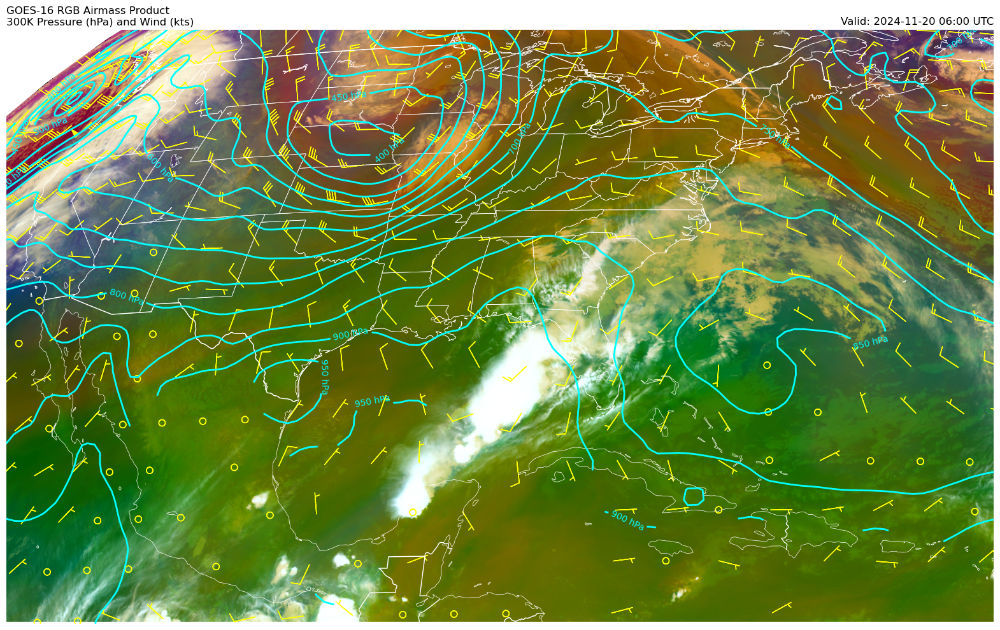

In [16]:
#Creating RGB Airmass Imagery with Isentropic Analysis

# Stacking RGB channels
RGB = np.stack([red, green, blue], axis=-1)

# Setting projection and extent from dataset
proj = ch8.metpy.cartopy_crs
x = ch8.x  # longitude
y = ch8.y  # latitude

# Plotting Satellite Data
plt.figure(1, figsize=(20,15))
ax = plt.subplot(111, projection=proj) 
ax.imshow(RGB, origin='upper', extent=(x.min(), x.max(), y.min(), y.max()), transform=proj)
ax.set_extent([-112, -62, 15, 50], ccrs.PlateCarree())

# Adding contours
cs = ax.contour(isent_pres.lon, isent_pres.lat, isent_pres_smooth, np.arange(100, 1000, 50),
                colors='cyan', linewidths=2,transform=ccrs.PlateCarree())
plt.clabel(cs, inline=1, fontsize=10, fmt='%d hPa', colors='cyan')

# Adding wind barbs
ax.barbs(isent_uwnd.lon, isent_uwnd.lat, isent_uwnd.values, isent_vwnd.values,
         color='yellow', length=7, transform=ccrs.PlateCarree())

         
# Adding geographic features
ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='white', lw=0.5)
ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor='white', lw=1.0)
ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor='white', lw=0.5)
ax.add_feature(cfeature.LAKES.with_scale('50m'),edgecolor='white', lw=0.5,facecolor='none')
plt.axis('off') 

# Adding titles
plt.title(f'GOES-16 RGB Airmass Product\n{level.m}K Pressure (hPa) and Wind (kts)', loc='left')
plt.title(f"Valid: {date:%Y-%m-%d %H:%M UTC}", loc='right')

# Saving plot
plt.savefig(f'{region}_{satellite}_{level.m}K_RGB_Isentropic_Surface_{date:%Y%m%d_%H}.png')
plt.show()
